
<h1>Game of SET card recognition</h1>

This colab walks through teach an AI to play SET, from card segmentation to classification, to forming Sets from a playing board.

A GPU runtime will greatly speed up training!

This was created as part of Aditi Jain's Final Project for CS231A.

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from google.colab import files
from __future__ import absolute_import, division, print_function, unicode_literals
import matplotlib.pylab as plt
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
from tensorflow import keras
from scipy import ndimage
from PIL import Image
from google.colab.patches import cv2_imshow

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

In [ ]:
# Folder 'Set' contains the training image for each of the 81 cards.
%cd drive/My\ Drive
%cd Set
%ls

# **Card Extraction Implemented From Scratch**
This section uses OpenCV to extract the edges of the 12 cards and display their bounding boxes on the image. Does not use cv.findContours directly.

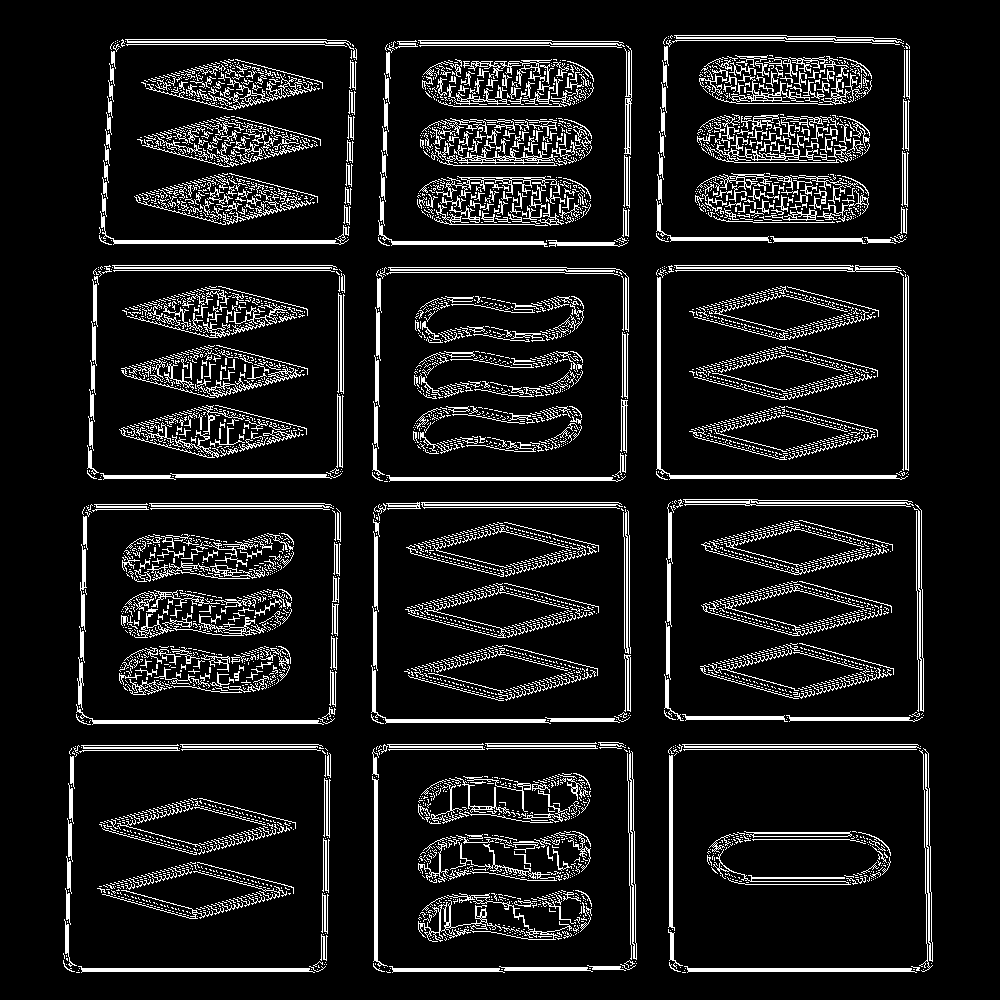

In [ ]:

def find_cards(image):
  # Step 0: Rescale
  image = cv.resize(image, (1000, 1000))
  # Step 1: Image to Grayscale
  image_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
  height, width = image_gray.shape

  # Step 2: Threshold the image
  thresh = 160
  ret, image_thresh = cv.threshold(image_gray, thresh, 255, cv.THRESH_BINARY)

  # Step 3: Apply smoothing to remove noise (e.g. edges on table).
  # Note: This may not even be necessary.
  blurred_image = cv.blur(image_thresh, (5,5))

  # Step 4: Calculate Image Gradient.
  
  # Sobel filters
  Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
  Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

  Ix = ndimage.filters.convolve(blurred_image, Kx)
  Iy = ndimage.filters.convolve(blurred_image, Ky)
    
  G = np.hypot(Ix, Iy)    
  G = G / G.max() * 255  # gradient magnitude
  theta = np.arctan2(Iy, Ix)  # gradient direction

  # Step 5: Non-Maximum Suppression
  nonmax_supp = np.zeros_like(G)
  angles = np.degrees(theta) 
  angles[angles < 0] += 180  # makes computation easier

  for i in range(1, height - 1):
    for j in range(1, width - 1):
      angle = angles[i, j]
      if 0 <= angle < 22.5 or (157.5 <= angle <= 180):  # left and right
        a = G[i, j-1]
        b = G[i, j+1]
      elif 22.5 <= angle < 22.5 + 45:  # search up-right and down-left
        a = G[i-1, j+1]
        b = G[i+1, j-1]
      elif 22.5 + 45 <= angle < 22.5 + 45 + 45:  # search up and down
        a = G[i-1, j]
        b = G[i+1, j]
      elif 22.5 + 45 + 45 <= angle < 22.5 + 45 + 45 + 45:  # search up-left and down-right
        a = G[i-1, j-1]
        b = G[i+1, j+1]

      if G[i, j] >= a and G[i, j] >= b:
        nonmax_supp[i, j] = G[i, j]
      else:
        nonmax_supp[i, j] = 0
  
  # Step 6: post-processing to remove any points which are not adjacent to two other high intensity points.
  highest_intensity = nonmax_supp.max()
  # coordinates with value > 0
  I, J = np.where(nonmax_supp > 0)
  postprocessed = np.zeros_like(nonmax_supp)
  N = len(I)
  for idx in range(N):
    i, j = I[idx], J[idx]
    neighbors_left_right = nonmax_supp[i-5:i+5, j-50:j+50]
    neighbors_up_down = nonmax_supp[i-50:i+50, j-5:j+5]
      
    n_ld = len(np.where(neighbors_left_right > 0)[0])
    n_ud = len(np.where(neighbors_up_down > 0)[0])
    if n_ld > 50 or n_ud > 50:
      postprocessed[i, j] = 255

  cv2_imshow(postprocessed)
  return postprocessed

board = cv.imread('setboard5.jpg')
board = cv.rotate(board, cv.ROTATE_90_CLOCKWISE) 
edges = find_cards(board)


Num lines after hough:  35


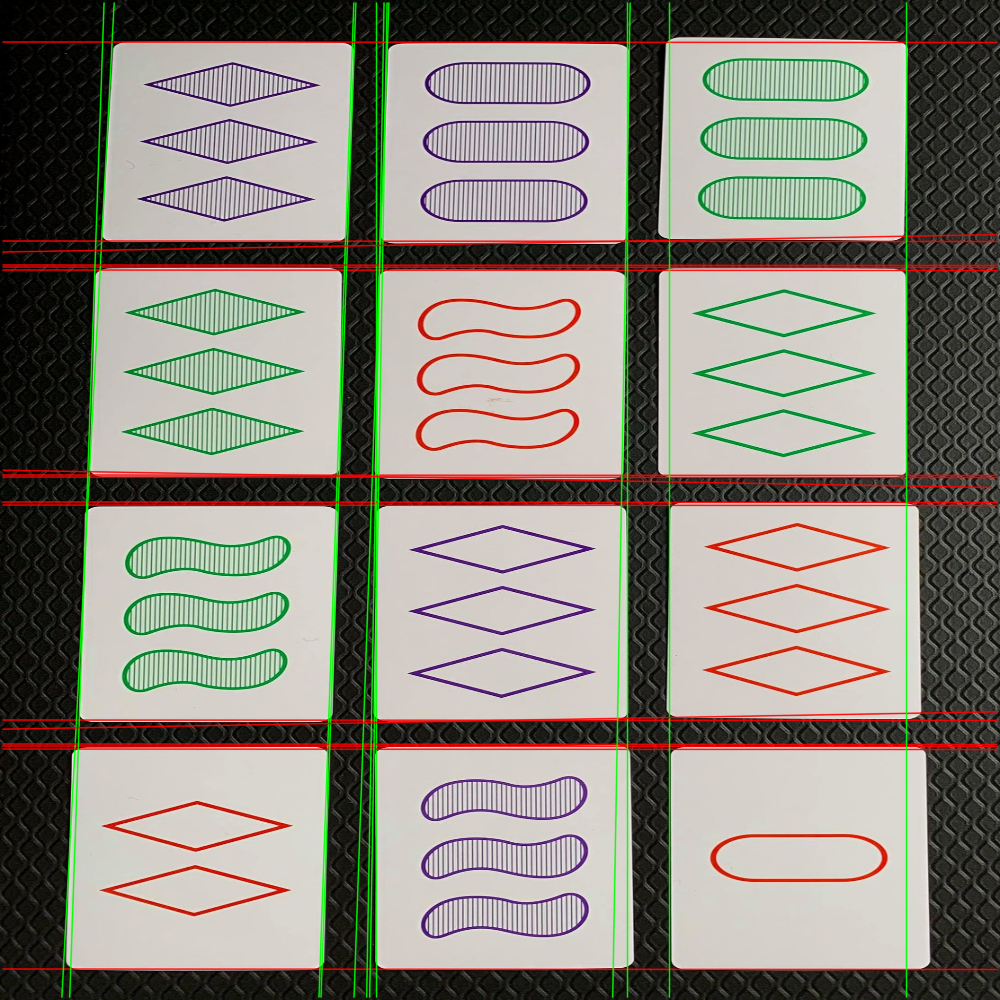

Num horizontal lines:  17
Num vertical lines:  12
Final intersections:  48


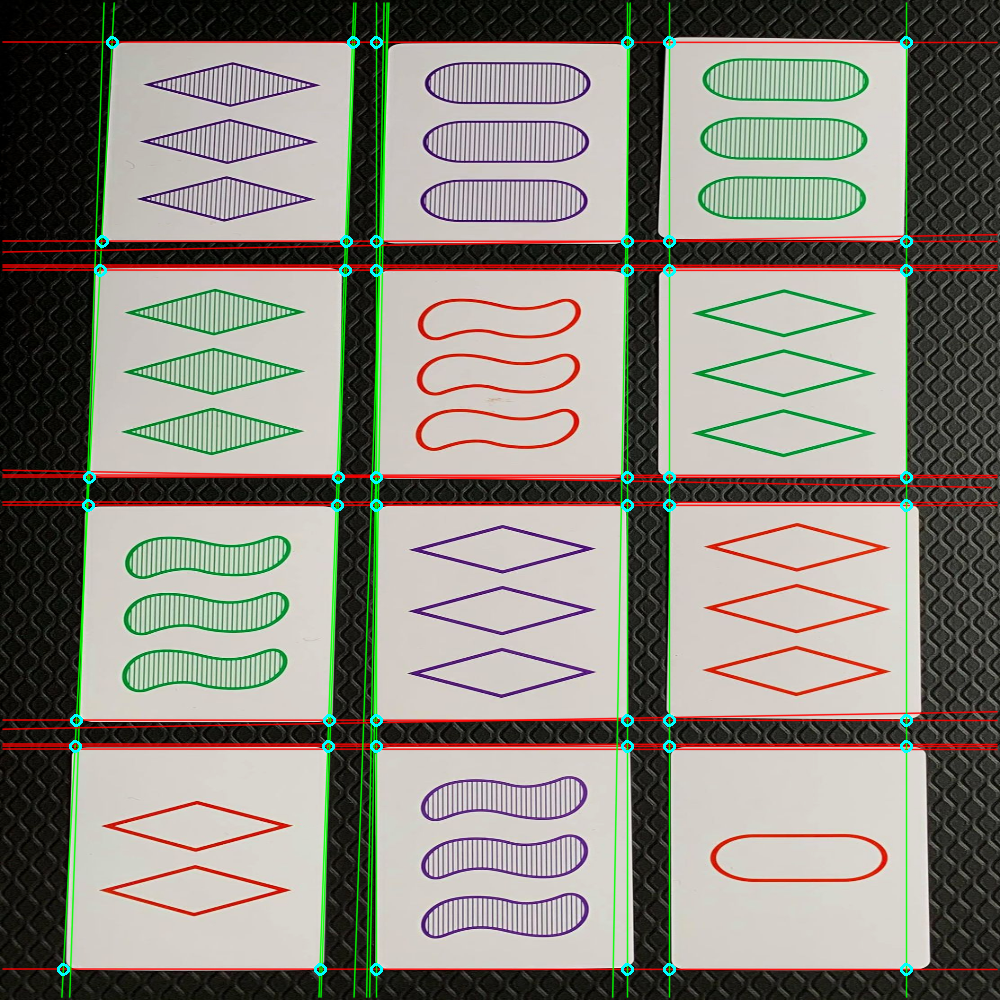

We have these many contours:  12
[[112, 42], [353, 42], [102, 241], [346, 241]]
[[376, 42], [627, 42], [376, 241], [627, 241]]
[[669, 42], [906, 42], [669, 241], [906, 241]]
[[100, 270], [345, 270], [89, 477], [338, 477]]
[[376, 270], [627, 270], [376, 477], [627, 477]]
[[669, 270], [906, 270], [669, 477], [906, 477]]
[[88, 505], [337, 505], [76, 720], [329, 720]]
[[376, 505], [627, 505], [376, 720], [627, 720]]
[[669, 505], [906, 505], [669, 720], [906, 720]]
[[75, 746], [328, 746], [63, 969], [320, 969]]
[[376, 746], [627, 746], [376, 969], [627, 969]]
[[669, 746], [906, 746], [669, 969], [906, 969]]


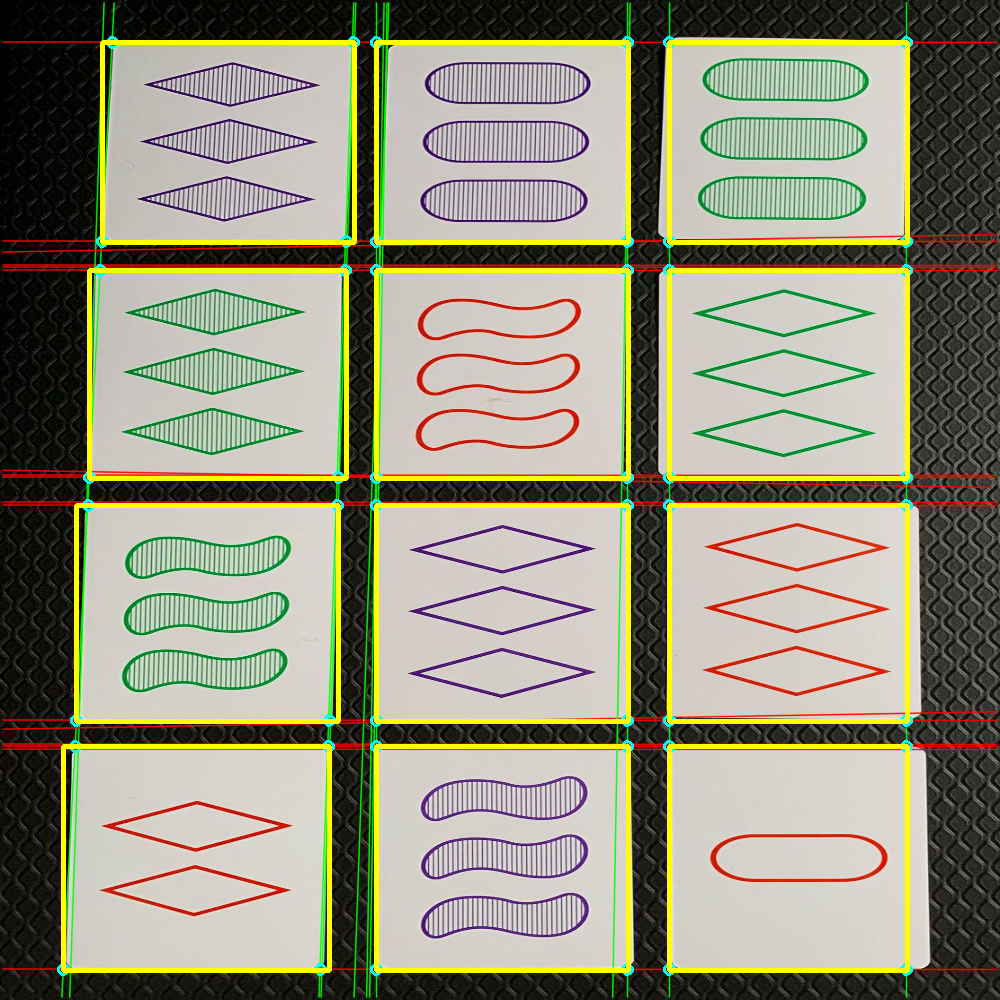

In [ ]:
# Use Hough Transformation to fit the lines
original_image = cv.resize(board, (1000,1000))
edges = np.uint8(edges)

# Version which uses HoughLinesP rather than HoughLines.
def HoughP():
  lines = cv.HoughLinesP(edges,rho=1,theta=np.pi/180,threshold=90,minLineLength=80, maxLineGap=10)
  print(len(lines))
  for line in lines:    
    for x1,y1,x2,y2 in line:
         cv.line(original_image,(x1,y1),(x2,y2),(0,255,0),2)

  cv2_imshow(original_image)


def intersection(line1, line2):
    """Finds the intersection of two lines given in Hesse normal form.

    Returns closest integer pixel locations.
    See https://stackoverflow.com/a/383527/5087436
    """
    rho1, theta1 = line1[0]
    rho2, theta2 = line2[0]
    A = np.array([
        [np.cos(theta1), np.sin(theta1)],
        [np.cos(theta2), np.sin(theta2)]
    ])
    b = np.array([[rho1], [rho2]])
    x0, y0 = np.linalg.solve(A, b)
    x0, y0 = int(np.round(x0)), int(np.round(y0))
    return (x0, y0)

# Version which uses HoughLines.
def Hough():
  lines = cv.HoughLines(image=edges,rho=1,theta=np.pi/180,threshold=325)

  print("Num lines after hough: ", len(lines))

  horizontal_lines = []
  vertical_lines = []
  for line in lines:    
    rho = line[0][0]
    theta = line[0][1]
    if (-10 * np.pi/180 < theta < 10*np.pi/180):
      color = (0,255,0)
      vertical_lines.append(line)
    elif (85*np.pi/180 < theta < 105*np.pi/180):  
      color = (0,0,255)
      horizontal_lines.append(line)
    else:
      continue
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    c = 1000
    x1 = int(x0 + c*(-b))
    y1 = int(y0 + c*(a))
    x2 = int(x0 - c*(-b))
    y2 = int(y0 - c*(a))

    cv.line(original_image,(x1,y1),(x2,y2),color,1, cv.LINE_AA)
  cv2_imshow(original_image)

  print("Num horizontal lines: ", len(horizontal_lines))
  print("Num vertical lines: ", len(vertical_lines))
  intersections = []
  for horiz_line in horizontal_lines:
    for vert_line in vertical_lines:
      (x0, y0) = intersection(horiz_line, vert_line)
     # cv.circle(original_image, (x0, y0), radius=5, color=(0,255,255))
      intersections.append([x0, y0]) 
  
 # cv2_imshow(original_image)

  # Post-process to remove points that are too close together.
  def not_satisfy2(a,k,critical):
    flag = False
    cx2,cy2 = k
    for i in a:
      cx1,cy1 = i
      if(abs(cx1-cx2) < critical and abs(cy1-cy2) < critical):
        flag=True
        break
    return flag

  def edit_list(a,length_of_a,critical):
    l = []
    l.append(a[0])
    i=1
    while(i < length_of_a):
      if(not_satisfy2(l,a[i],critical)==True):
        i+=1
      else:
        l.append(a[i])
        i+=1
    return l

  intersections_after = edit_list(intersections, len(intersections), 23)
  print("Final intersections: ", len(intersections_after))
  for xion in intersections_after:
    cv.circle(original_image, (xion[0], xion[1]), radius=5, color=(255,255,0),thickness=2)

  cv2_imshow(original_image)

  def getContours(points):
    cards = {card: [] for card in range(12)} 
    row = 0
    while row < 4:
      # Sort by x-coord. 
      sorted_by_y = sorted(points, key = lambda p : p[1])
      # Take the first 6, and sort by y.
      sorted_by_x = sorted(sorted_by_y[:6], key = lambda p : p[0])
      cards[3*row] += sorted_by_x[:2]
      cards[3*row+1] += sorted_by_x[2:4]
      cards[3*row+2] += sorted_by_x[4:6]
      for c in sorted_by_x: points.remove(c)
      # Take the next 6, and sort by y again.
      sorted_by_x = sorted(sorted_by_y[6:12], key = lambda p : p[0])
      cards[3*row] += sorted_by_x[:2]
      cards[3*row+1] += sorted_by_x[2:4]
      cards[3*row+2] += sorted_by_x[4:6]
      for c in sorted_by_x: points.remove(c)
      row += 1
    return cards

  contours = getContours(intersections_after)
  print("We have these many contours: ", len(contours))
  for i, contour in contours.items():
    print(contour)
    if len(contour) == 0:
      continue
    x,y,w,h = cv.boundingRect(np.array(contour))
    cv.rectangle(original_image, (x,y), (x+w, y+h), color=(0, 255, 255), thickness=4)

  cv2_imshow(original_image)


Hough()

# **Card Extraction via cv.findContours**
This section uses OpenCV to extract the edges of the 12 cards and display their bounding boxes on the image.

In [ ]:
img = cv.imread('setboard5.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

In [ ]:
thresh = 150
ret,thresh_img = cv.threshold(img_gray, thresh, 255, cv.THRESH_BINARY)
contours, _ = cv.findContours(thresh_img, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
contours=sorted(contours, key = cv.contourArea, reverse = True)[:12]


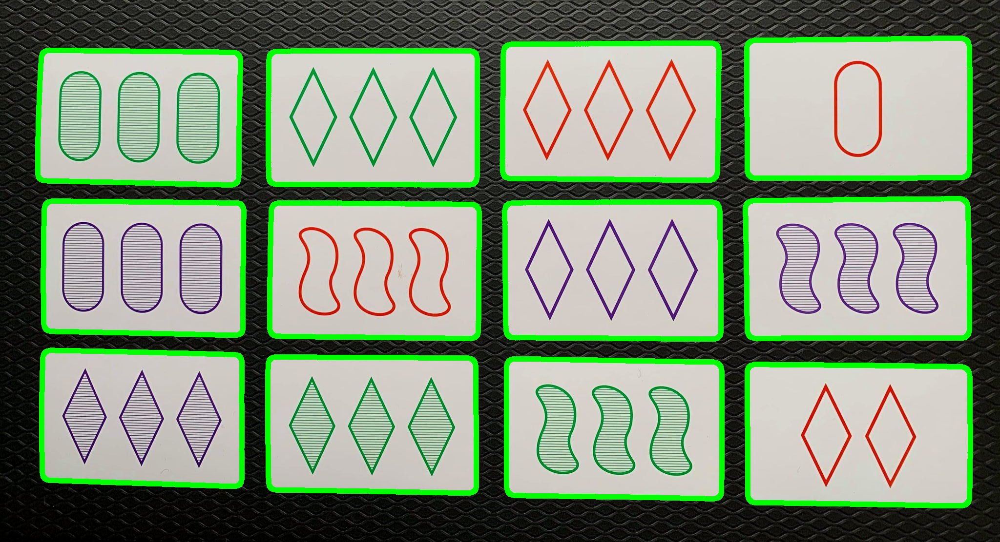

In [ ]:
img_contours = img.copy()
cv.drawContours(img_contours, contours, -1, (0,255,0), 10)
cv2_imshow(img_contours)


In [ ]:
# Crop contours from image.
%mkdir "inference"
for (i,c) in enumerate(contours):
    x,y,w,h= cv.boundingRect(c)
    cropped_contour = img[y:y+h, x:x+w]
    resized = cv.resize(cropped_contour, (224,224))
    cv.imwrite("inference/" + str(i) + ".jpg", resized)
    #plt.imshow(resized)
    #plt.show()
    #cv.waitKey(0)

    
#cv.destroyAllWindows()

# **Sythetic Training Dataset**

This section generates training data for a model that will predict which of the 81 cards is in the image.

In [ ]:
import random
from skimage import exposure
from skimage import transform

def generateSyntheticTrainingDataForImage(img, base_folder):
  height, width, channels = img.shape
  #angles = [-15, 0, 0, 0, 0, 15]
  #scales = [0.75, 0.85, 1.0, 1.0, 1.0, 1.15, 1.25]
  gamma = [0.5, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.5]
  shears = [-0.03, -0.02, -0.01, 0, 0.01, 0.02, 0.03]
  flips = [0, 1, -1]
  sigmoid_cutoff = [0.2, 0.4, 0.5, 0.6]

  for i in range(300):
    # Random exposure change
    img1 = exposure.adjust_gamma(img, random.choice(gamma))

    # Random Sigmoid Correction
    img1 = exposure.adjust_sigmoid(img1, random.choice(sigmoid_cutoff))

    # Random Flip (or no flip)
    flip = random.choice(flips)
    if  flip >= 0:
      img1 = cv.flip(img1, flip)

    # Random Affine Transform.
    affine_tf = transform.AffineTransform(shear=random.choice(shears))
    warped = transform.warp(img1, inverse_map=affine_tf, preserve_range=True)
    warped = cv.resize(warped, (150,150))

    cv.imwrite(base_folder + "/" + str(i) + ".jpg", warped)

In [ ]:
# Pre-processing to segment the card to discard the surrounding table.
# Generate synthetic training data.
training_data_folder = "synthetic23"
%mkdir $training_data_folder
for i in range(81):
  img = cv.imread(str(i) + "/" + str(i) + ".jpg")
  img = cv.rotate(img, cv.ROTATE_90_COUNTERCLOCKWISE) 
  img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  thresh = 150
  ret,thresh_img = cv.threshold(img_gray, thresh, 255, cv.THRESH_BINARY)
  contours, _ = cv.findContours(thresh_img, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
  contour=sorted(contours, key = cv.contourArea, reverse = True)[0]
  x,y,w,h = cv.boundingRect(contour)
  cropped_contour = img[y:y+h, x:x+w]
  resized = cv.resize(cropped_contour, (150,150))
  folder_for_label = training_data_folder + "/" + str(i)
  %mkdir $folder_for_label
  generateSyntheticTrainingDataForImage(resized, folder_for_label)

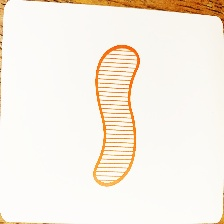

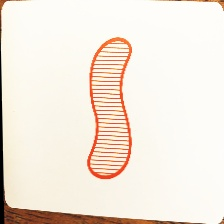

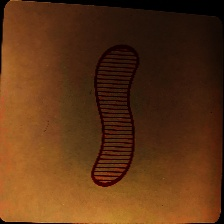

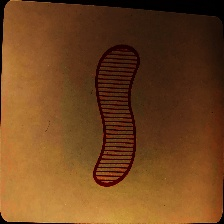

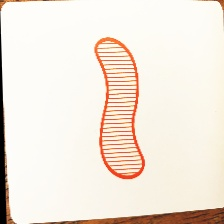

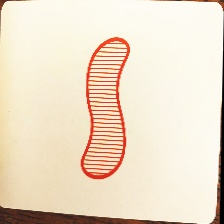

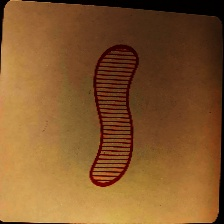

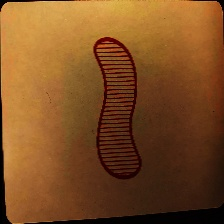

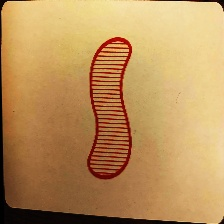

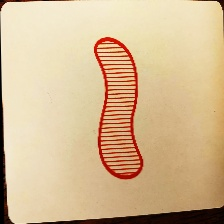

In [ ]:
# Visualize a few images.
training_data_folder = "synthetic23"
for i in range(10):
  cv2_imshow(cv.imread(training_data_folder + "/21/" + str(i) + ".jpg")) 

# **Train the Classifier**
This section trains the model that will predict which of the 81 cards is in the image.


In [ ]:
IMAGE_SHAPE = (150, 150)
TRAINING_DATA_DIR = 'synthetic22'
print(TRAINING_DATA_DIR);
datagen_kwargs = dict(rescale=1./255, validation_split=.20)
valid_datagen = tf.keras.preprocessing.image.ImageDataGenerator(**datagen_kwargs)
valid_generator = valid_datagen.flow_from_directory(
TRAINING_DATA_DIR,
subset="validation",
shuffle=True,
target_size=IMAGE_SHAPE,
batch_size=128
)
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(**datagen_kwargs)
train_generator = train_datagen.flow_from_directory(
TRAINING_DATA_DIR,
subset="training",
shuffle=True,
target_size=IMAGE_SHAPE,
batch_size=128)

synthetic23
Found 4860 images belonging to 81 classes.
Found 19440 images belonging to 81 classes.


In [ ]:
image_batch_train, label_batch_train = next(iter(train_generator))
print("Image batch shape: ", image_batch_train.shape)
print("Label batch shape: ", label_batch_train.shape)
dataset_labels = sorted(train_generator.class_indices.items(), key=lambda pair:pair[1])
dataset_labels = np.array([key.title() for key, value in dataset_labels])
print(dataset_labels)

Image batch shape:  (128, 224, 224, 3)
Label batch shape:  (128, 81)
['0' '1' '10' '11' '12' '13' '14' '15' '16' '17' '18' '19' '2' '20' '21'
 '22' '23' '24' '25' '26' '27' '28' '29' '3' '30' '31' '32' '33' '34' '35'
 '36' '37' '38' '39' '4' '40' '41' '42' '43' '44' '45' '46' '47' '48' '49'
 '5' '50' '51' '52' '53' '54' '55' '56' '57' '58' '59' '6' '60' '61' '62'
 '63' '64' '65' '66' '67' '68' '69' '7' '70' '71' '72' '73' '74' '75' '76'
 '77' '78' '79' '8' '80' '9']


In [ ]:
# First tried MobilenetV2. Wasn't great.
model = tf.keras.Sequential([
hub.KerasLayer("https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4",
output_shape=[1280],
trainable=False),
tf.keras.layers.Dropout(0.4),
tf.keras.layers.Dense(train_generator.num_classes, activation='softmax')
])
model.build([None, 224, 224, 3])
model.summary()
model.compile(
optimizer=tf.keras.optimizers.Adam(),
loss='categorical_crossentropy',
metrics=['acc'])



Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1280)              2257984   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1280)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 81)                103761    
Total params: 2,361,745
Trainable params: 103,761
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
# From-Scratch CNN

from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D

model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu'))
model.add(Dense(81, activation='softmax'))

model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adam(),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1280)              2257984   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1280)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 81)                103761    
Total params: 2,361,745
Trainable params: 103,761
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
steps_per_epoch = np.ceil(train_generator.samples/train_generator.batch_size)
val_steps_per_epoch = np.ceil(valid_generator.samples/valid_generator.batch_size)
hist = model.fit(
  train_generator,
  epochs=10,
  verbose=1,
  steps_per_epoch=steps_per_epoch,
  validation_data=valid_generator,
  validation_steps=val_steps_per_epoch).history

Epoch 1/10
152/152 [==============================] - 74s 458ms/step - loss: 2.3466 - acc: 0.4218 - val_loss: 0.3021 - val_acc: 0.9572
Epoch 2/10
152/152 [==============================] - 68s 445ms/step - loss: 0.3375 - acc: 0.9227 - val_loss: 0.1371 - val_acc: 0.9870
Epoch 3/10
152/152 [==============================] - 67s 438ms/step - loss: 0.1779 - acc: 0.9650 - val_loss: 0.0860 - val_acc: 0.9895
Epoch 4/10
152/152 [==============================] - 66s 437ms/step - loss: 0.1144 - acc: 0.9811 - val_loss: 0.0608 - val_acc: 0.9953
Epoch 5/10
152/152 [==============================] - 66s 436ms/step - loss: 0.0847 - acc: 0.9863 - val_loss: 0.0466 - val_acc: 0.9932
Epoch 6/10
152/152 [==============================] - 67s 440ms/step - loss: 0.0678 - acc: 0.9892 - val_loss: 0.0366 - val_acc: 0.9969
Epoch 7/10
152/152 [==============================] - 68s 451ms/step - loss: 0.0524 - acc: 0.9935 - val_loss: 0.0296 - val_acc: 0.9981
Epoch 8/10
152/152 [==============================] - 6

In [ ]:
%mkdir "saved_models"
new_dir = "saved_models/synthetic22" 
%mkdir $new_dir
model.save(new_dir)

mkdir: cannot create directory ‘saved_models’: File exists
mkdir: cannot create directory ‘saved_models/synthetic22’: File exists


KeyboardInterrupt: ignored

# **Evaluation**
This section evaluates the model on (1) never seen before cards w/o ground truth, (2) validation set w/ ground truth.


In [ ]:
model = keras.models.load_model("saved_models/synthetic22")
                              #  custom_objects={'KerasLayer':hub.KerasLayer})

In [ ]:
def class_to_string(c):
  # First convert to base 3 to isolate each attribute.
  repr = np.base_repr(c, base=3)
  repr = repr.zfill(4)
  color = repr[0] 
  if color == "0":
    color = "Red"
  elif color == "1":
    color = "Green"
  else:
    color = "Purple"

  shape = repr[1]
  if shape == "0":
    shape = "Diamond"
  elif shape == "1":
    shape = "Curved"
  else: 
    shape = "Squigly"

  fill = repr[2] 
  if fill == "0":
    fill = "Solid"
  elif fill == "1":
    fill = "Striped"
  else:
    fill = "None"

  number = repr[3]
  if number == "0":
    number = "1"
  elif number == "1":
    number = "2"
  else:
    number = "3"

  return "Color: {0}\n, Shape: {1}\n, Fill: {2}\n, Number: {3}\n".format(color,shape,fill,number)

In [ ]:
inference_kwargs = dict(rescale=1./255)
inference_datagen = tf.keras.preprocessing.image.ImageDataGenerator(**inference_kwargs)
inference_generator = inference_datagen.flow_from_directory(
"inference_board5",
target_size=(150,150),
class_mode=None,
shuffle=False
)
inference_generator.reset()

Found 12 images belonging to 1 classes.


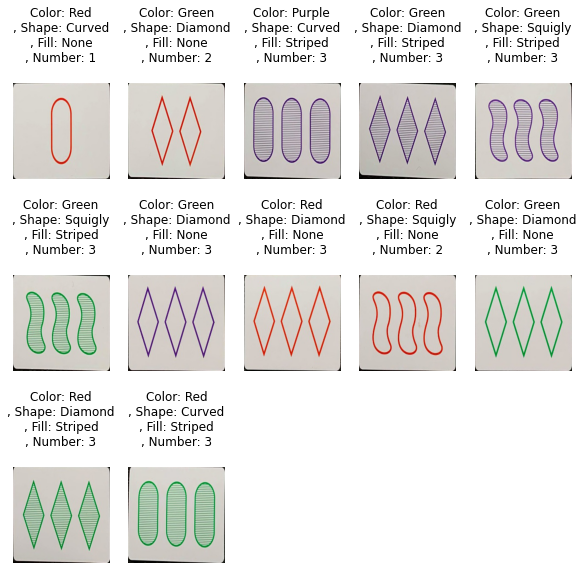

In [ ]:
inference_image_batch = next(iter(inference_generator))
inference_predictions = model.predict(inference_image_batch)
predicted_ids = np.argmax(inference_predictions, axis=-1)
predicted_labels = np.array(dataset_labels)[predicted_ids]

plt.figure(figsize=(10,20))
plt.subplots_adjust(hspace=0.5)
for n in range(12):
  plt.subplot(6,5,n+1)
  plt.imshow(inference_image_batch[n])
  plt.title(class_to_string(int(predicted_labels[n].title())))
  plt.axis('off')

Validation batch shape: (128, 150, 150, 3)


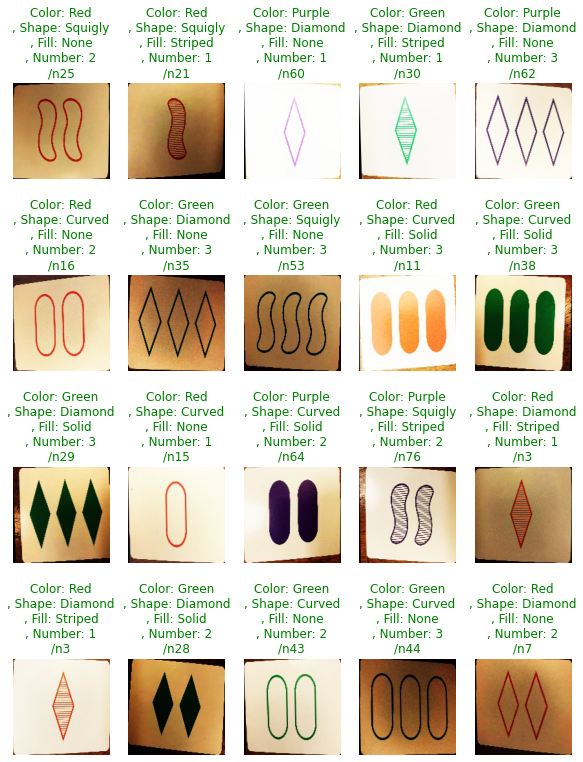

In [ ]:
val_image_batch, val_label_batch = next(iter(valid_generator))
true_label_ids = np.argmax(val_label_batch, axis=-1)
print("Validation batch shape:", val_image_batch.shape)
tf_model_predictions = model.predict(val_image_batch)
predicted_ids = np.argmax(tf_model_predictions, axis=-1)
predicted_labels = np.array(dataset_labels)[predicted_ids]
plt.figure(figsize=(10,20))
plt.subplots_adjust(hspace=0.5)
for n in range(20):
  plt.subplot(6,5,n+1)
  plt.imshow(val_image_batch[n])
  color = "green" if predicted_ids[n] == true_label_ids[n] else "red"
  plt.title(class_to_string(int(predicted_labels[n].title())) + "/n" + predicted_labels[n],color=color)
  plt.axis('off')

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

IMAGE_SHAPE = (150, 150)
TRAINING_DATA_DIR = 'synthetic22'
datagen_kwargs = dict(rescale=1./255, validation_split=.20)
valid_datagen1 = tf.keras.preprocessing.image.ImageDataGenerator(**datagen_kwargs)
valid_generator1 = valid_datagen1.flow_from_directory(
TRAINING_DATA_DIR,
subset="validation",
shuffle=False,
target_size=IMAGE_SHAPE,
batch_size=3240
)
val_image_batch1, val_label_batch1 = next(iter(valid_generator1))
tf_model_predictions1 = model.predict(val_image_batch1)

true_label_ids1 = np.argmax(val_label_batch1, axis=-1)
predicted_ids1 = np.argmax(tf_model_predictions1, axis=-1)
print(true_label_ids1.shape)
print(predicted_ids1.shape)
print(classification_report(true_label_ids1, predicted_ids1))


Found 4860 images belonging to 81 classes.
(3240,)
(3240,)
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       1.00      1.00      1.00        60
           2       1.00      1.00      1.00        60
           3       1.00      1.00      1.00        60
           4       1.00      1.00      1.00        60
           5       1.00      1.00      1.00        60
           6       1.00      1.00      1.00        60
           7       1.00      1.00      1.00        60
           8       1.00      1.00      1.00        60
           9       1.00      1.00      1.00        60
          10       1.00      1.00      1.00        60
          11       1.00      1.00      1.00        60
          12       1.00      1.00      1.00        60
          13       1.00      1.00      1.00        60
          14       1.00      1.00      1.00        60
          15       1.00      1.00      1.00        60
          16       1.0

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# **End to End**
This section takes the game board, extracts the cards, classifies each card
and then highlights sets.

Found 12 images belonging to 1 classes.


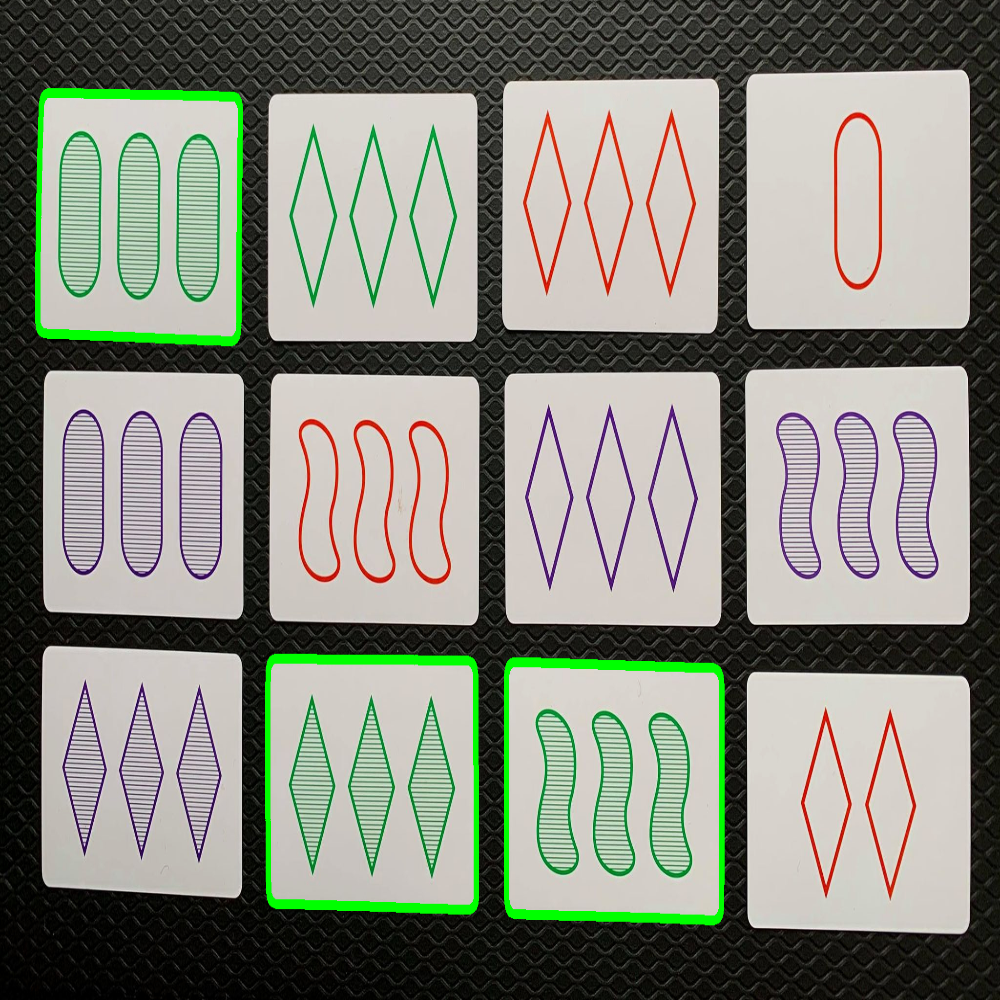

Latency: 0:00:01.674769


In [ ]:
# Returns the bounding box for each card (list of 12 elements).
# Writes the cropped images out to a directory for inference.
def getCards(board_image, path_to_images):
  board_gray = cv.cvtColor(board_image, cv.COLOR_BGR2GRAY)
  thresh = 150
  ret,thresh_img = cv.threshold(board_gray, thresh, 255, cv.THRESH_BINARY)
  contours, _ = cv.findContours(thresh_img, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
  contours = sorted(contours, key = cv.contourArea, reverse = True)[:12]
  cropped_images = []
  for (i,c) in enumerate(contours):
    x,y,w,h= cv.boundingRect(c)
    cropped_contour = board_image[y:y+h, x:x+w]
    resized = cv.resize(cropped_contour, (150,150))
    cv.imwrite(path_to_images + "/" + str(i) + ".jpg", resized)
    cropped_images.append(resized)
  return contours

import re

# Given a path to the inference data, path to the model, and mapping from 
# integer to class string, returns a 12 dim list of predicted classes.
def classifyCards(path_to_images, model_path, class_to_label_mapping):
  model = keras.models.load_model(model_path)
  inference_kwargs = dict(rescale=1./255)
  inference_datagen = tf.keras.preprocessing.image.ImageDataGenerator(**inference_kwargs)
  inference_generator = inference_datagen.flow_from_directory(
  path_to_images,
  target_size=(150,150),
  class_mode=None,
  shuffle=False
  )
  inference_generator.reset()
  inference_image_batch = next(iter(inference_generator))
  inference_predictions = model.predict(inference_image_batch)
  predicted_ids = np.argmax(inference_predictions, axis=-1)
  predicted_labels = np.array(dataset_labels)[predicted_ids]
  filenames = inference_generator.filenames
  idx_to_pred = dict()
  for n in range(len(predicted_labels)):
    idx = int(re.findall(r'\d+', filenames[n])[0])
    #print(idx)
    idx_to_pred[idx] = int(predicted_labels[n].title())
    #print(class_to_string(int(predicted_labels[n].title())))
    #cv2_imshow(cv.imread(path_to_images + "/" + filenames[n]))
  
  correct_order = []
  for i in range(len(predicted_labels)):
    correct_order.append(idx_to_pred[i])
  return correct_order

from itertools import combinations

# Helper function to evaluate if the magic rule condition is met.
def attributeAllSameOrAllDifferent(attribute):
  return len(attribute) == 3 or len(attribute) == 1

# Checks each combination of 3 cards from the board for a set.
# Breaks as soon as it finds a set.
def formSets(predicted_labels, contours, board_image):
  label_to_contour = dict()
  for i in range(len(predicted_labels)):
    label_to_contour[predicted_labels[i]] = contours[i]

  for card_a, card_b, card_c in combinations(predicted_labels, 3):
    repr_a = np.base_repr(card_a, base=3).zfill(4)
    repr_b = np.base_repr(card_b, base=3).zfill(4)
    repr_c = np.base_repr(card_c, base=3).zfill(4)
    colors = {repr_a[0], repr_b[0], repr_c[0]}
    shapes = {repr_a[1], repr_b[1], repr_c[1]}
    fills = {repr_a[2], repr_b[2], repr_c[2]}
    numbers = {repr_a[3], repr_b[3], repr_c[3]}
    if (attributeAllSameOrAllDifferent(colors) and
        attributeAllSameOrAllDifferent(shapes) and
        attributeAllSameOrAllDifferent(fills) and
        attributeAllSameOrAllDifferent(numbers)):
      # We have a Set! Highlight it, and break.
      img_contours = board_image.copy()
      cv.drawContours(img_contours, [label_to_contour[card_a], label_to_contour[card_b], label_to_contour[card_c]], -1, (0,255,0), 10)
      img_contours = cv.resize(img_contours, (1000,1000))
      cv2_imshow(img_contours)
      return
  print("No sets found... or the model just didn't catch them.")

from datetime import datetime

now = datetime.now()

board_image = cv.imread('setboard5.jpg')
%mkdir "inference_board5"
path_to_cropped_images = "inference_board5/unlabeled"
%mkdir $path_to_cropped_images

contours = getCards(board_image, path_to_cropped_images)
dataset_labels = ['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2','20', '21',
 '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', '32', '33', '34', '35',
 '36', '37', '38', '39', '4', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49',
 '5', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '6', '60', '61', '62',
 '63', '64', '65', '66', '67', '68', '69', '7', '70', '71', '72', '73', '74', '75', '76',
 '77', '78', '79', '8', '80', '9']
predicted_labels = classifyCards("inference_board5", "saved_models/synthetic22", dataset_labels)
formSets(predicted_labels, contours, board_image)

done = datetime.now()

print("Latency: " + str(done - now))

